# PYNQ -  Audio Overlay

CityU EE x GEF AIot Program

This notebook shows the basic functoion of the Audio Overlay of PYTNQ, including recording and playback features of the PYNQ-Z2.  

It uses the audio jack `HP+MIC` to play back recordings; it can take inputs from 
the microphone on `HP+MIC` or `LINE_IN`. Pre-recorded audio sample can also be taken
as input. Moreover, visualization with matplotlib is shown.

---
##  Setup 
To run through this notebook, all that is required is a **PYNQ-Z2 board with an internet connection** and a set of **headphones with a built in microphone and a 3.55 mm jack**. 

Insert the headphone jack into the `HP+MIC` port on the PYNQ-Z2 board. It is highlighted in the blue box in the top left of the picture above.

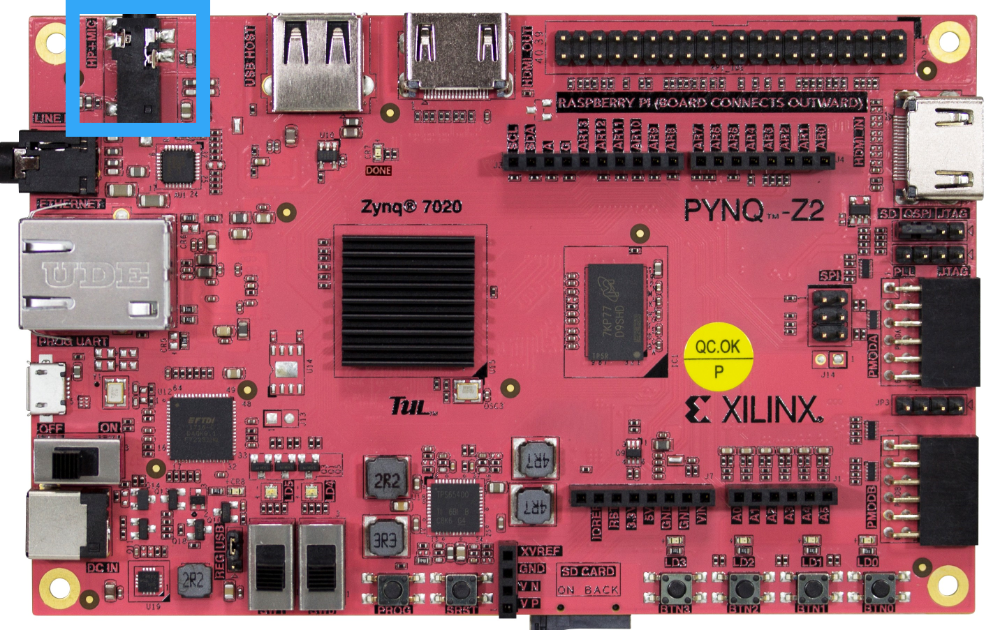


### Install Dependencies

In [50]:
!apt update
!apt install -y sox ffmpeg flac
!pip3 install gtts pysndfx speechRecognition pydub

Hit:1 http://ports.ubuntu.com/ubuntu-ports bionic InRelease
Reading package lists... Done                  
Building dependency tree       
Reading state information... Done
All packages are up to date.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:3.4.2-2).
flac is already the newest version (1.3.2-1).
sox is already the newest version (14.4.2-3).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


---
## Capture Audio

This section will discuss some of the underlying principals for capturing signals for use in digital systems.

It's not neccessary to completely understand all the material in this section in order to exploit the audio features of PYNQ. But it's good to know and gives us something to do while the relevant dependencies install.

### How is Audio Captured?

Real world signals, like sound, have to be translated into a format the can be processed by digital systems. The image below shows the main stages of this process.

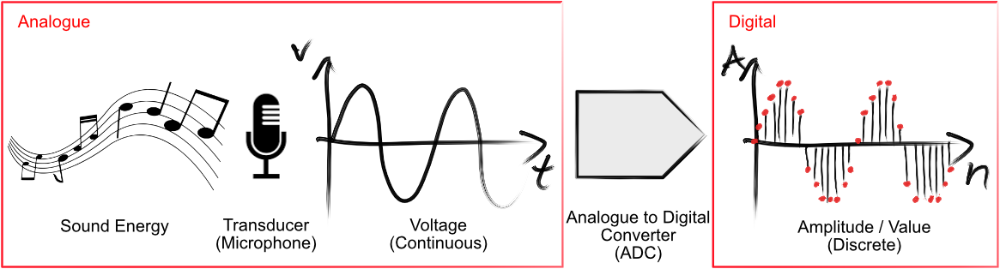

Sound, as it exists in the real world, is just a type of energy called sound energy.

For it to be useful to us, it must be convereted into a type of energy electrical systems can understand. That's where the transducer comes in. A transducer converts one form of energy to another. In our case, the microphone acts as our transducer, converting sound energy to an electrical energy like voltage.

The voltage produced by the microphone is an analogue signal. To understand what this means, think about taking a point on the graph and measuring the time value (x-axis) and the voltage (y-axis). For example, is the voltage 1 V or 1.01 V or 1.0000001V. The same is true for the time value. Is it at 3 s or 3.00000000001 s. How exact can it be? In analogue systems, the precision is effectively infinite - meaning it gets smaller and smaller forever.

This type of signal is no good for use in our digital system. In digital systems, values are represented as binary bits. This means the more values you want to represent, the more bits you need to use. Representing too many values is impractical. It will take up too much memory and can have other consequences like requiring a lot of power.

An ADC takes this continuous analogue signal and converts it to a discrete digital signal. For voltage, you can think of it as rounding the voltage to a particular number of decimal points. An ADC rounds to a number of bits. The ADC used on the PYNQ-Z2 has 24-bit precision. This process is called quantisation.

For time, the ADC takes a sample at a regular interval. This is referred to as sampling. For instance, audio is sometimes sampled at 48 kHz. That is, the audio is sampled 48000 times a second.

Quantisation and sampling are two fundametal concepts in digital signal processing.

### Import Library and Create new audio object

In [1]:
from pynq.overlays.base import BaseOverlay
base = BaseOverlay("base.bit")
pAudio = base.audio

### Set Output Volume
Start with low volume, and tune up if needed.

In [2]:
pAudio.set_volume(40)

### Choose Input Source
Users can select either `LINE_IN`, or `HP+MIC` as the input port.
In the following example, we choose `MIC`. 

To choose `MIC`:
```python
pAudio.select_microphone()
```
or choose `LINE_IN`:
```python
pAudio.select_line_in()
```

In [3]:
pAudio.select_microphone()

### Bypass audio
We can then bypass the audio from mic to headphone. You should be able to hear yourself.

In [4]:
pAudio.bypass(seconds=5)

### Record and save
Record a 5-second sample and save it into a file.

In [100]:
pAudio.record(5)
pAudio.save("recording_0.wav")

### Load and play
Load a sample and play the loaded sample.

In [14]:
pAudio.load("data/recording_demo.wav")
pAudio.play()

You are then try to load your own recording!

In [102]:
#Write your code here



### Play in notebook
Since the samples are in 24-bit PCM format, 
users can play the audio directly in notebook.

In [79]:
IPAudio("data/recording_demo.wav")

You are then try to load your own recording!

In [101]:
#Write your code here



---

## Plotting PCM data

Users can display the audio data in notebook:

1. Extract the audio signal from the *.wav file.
2. Plot the audio signal's amplitude over time.
3. Plot the audio signal's frequency response. 
4. Plot the spectrogram of the audio signal.

The next cell reads the saved audio file and processes it into a `numpy` array.
Note that if the audio sample width is not standard, additional processing
is required. In the following example, the `sample_width` is read from the
wave file itself (24-bit dual-channel PCM audio, where `sample_width` is 3 bytes).

In [81]:
%matplotlib inline
import wave
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.fftpack import fft

def plotAmplitudeOverTime(wav_path):
    with wave.open(wav_path, 'r') as wav_file:
        raw_frames = wav_file.readframes(-1)
        num_frames = wav_file.getnframes()
        num_channels = wav_file.getnchannels()
        sample_rate = wav_file.getframerate()
        sample_width = wav_file.getsampwidth()

    temp_buffer = np.empty((num_frames, num_channels, 4), dtype=np.uint8)
    raw_bytes = np.frombuffer(raw_frames, dtype=np.uint8)
    temp_buffer[:, :, :sample_width] = raw_bytes.reshape(-1, num_channels, 
                                                        sample_width)
    temp_buffer[:, :, sample_width:] = \
        (temp_buffer[:, :, sample_width-1:sample_width] >> 7) * 255
    frames = temp_buffer.view('<i4').reshape(temp_buffer.shape[:-1])
    
    for channel_index in range(num_channels):
        plt.figure(num=None, figsize=(15, 3))
        plt.title('Audio in Time Domain (Channel {})'.format(channel_index))
        plt.xlabel('Time in s')
        plt.ylabel('Amplitude')
        time_axis = np.arange(0, num_frames/sample_rate, 1/sample_rate)
        plt.plot(time_axis, frames[:, channel_index])
        plt.show()
        
def plotFrequencySpectrum(wav_path, xUpLimit = 1000, xLowLimit = 20):
    with wave.open(wav_path, 'r') as wav_file:
        raw_frames = wav_file.readframes(-1)
        num_frames = wav_file.getnframes()
        num_channels = wav_file.getnchannels()
        sample_rate = wav_file.getframerate()
        sample_width = wav_file.getsampwidth()

    temp_buffer = np.empty((num_frames, num_channels, 4), dtype=np.uint8)
    raw_bytes = np.frombuffer(raw_frames, dtype=np.uint8)
    temp_buffer[:, :, :sample_width] = raw_bytes.reshape(-1, num_channels, 
                                                        sample_width)
    temp_buffer[:, :, sample_width:] = \
        (temp_buffer[:, :, sample_width-1:sample_width] >> 7) * 255
    frames = temp_buffer.view('<i4').reshape(temp_buffer.shape[:-1])
    
    for channel_index in range(num_channels):
        plt.figure(num=None, figsize=(15, 3))
        plt.title('Audio in Frequency Demain (Channel {})'.format(channel_index))
        plt.xlabel('Frequency in Hz')
        plt.ylabel('Magnitude')
        temp = fft(frames[:, channel_index])
        yf = temp[1:len(temp)//2]
        xf = np.linspace(0.0, sample_rate/2, len(yf))
        plt.xlim(xLowLimit,xUpLimit)
        plt.plot(xf, abs(yf))
        plt.show()
        
def plotFrequencySpectrumLLog(wav_path, xUpLimit = 1000, xLowLimit = 20):
    with wave.open(wav_path, 'r') as wav_file:
        raw_frames = wav_file.readframes(-1)
        num_frames = wav_file.getnframes()
        num_channels = wav_file.getnchannels()
        sample_rate = wav_file.getframerate()
        sample_width = wav_file.getsampwidth()

    temp_buffer = np.empty((num_frames, num_channels, 4), dtype=np.uint8)
    raw_bytes = np.frombuffer(raw_frames, dtype=np.uint8)
    temp_buffer[:, :, :sample_width] = raw_bytes.reshape(-1, num_channels, 
                                                        sample_width)
    temp_buffer[:, :, sample_width:] = \
        (temp_buffer[:, :, sample_width-1:sample_width] >> 7) * 255
    frames = temp_buffer.view('<i4').reshape(temp_buffer.shape[:-1])
    
    for channel_index in range(num_channels):
        plt.figure(num=None, figsize=(15, 3))
        plt.title('Audio in Frequency Demain (Channel {})'.format(channel_index))
        plt.xlabel('Frequency in Hz')
        plt.xscale('log')
        plt.ylabel('Magnitude')
        temp = fft(frames[:, channel_index])
        yf = temp[1:len(temp)//2]
        xf = np.linspace(0.0, sample_rate/2, len(yf))
        plt.xlim(xLowLimit,xUpLimit)
        plt.plot(xf, abs(yf))
        plt.show()
        
def plotFrequencyOverTime(wav_path):
    with wave.open(wav_path, 'r') as wav_file:
        raw_frames = wav_file.readframes(-1)
        num_frames = wav_file.getnframes()
        num_channels = wav_file.getnchannels()
        sample_rate = wav_file.getframerate()
        sample_width = wav_file.getsampwidth()

    temp_buffer = np.empty((num_frames, num_channels, 4), dtype=np.uint8)
    raw_bytes = np.frombuffer(raw_frames, dtype=np.uint8)
    temp_buffer[:, :, :sample_width] = raw_bytes.reshape(-1, num_channels, 
                                                        sample_width)
    temp_buffer[:, :, sample_width:] = \
        (temp_buffer[:, :, sample_width-1:sample_width] >> 7) * 255
    frames = temp_buffer.view('<i4').reshape(temp_buffer.shape[:-1])
    
    for channel_index in range(num_channels):
        np.seterr(divide='ignore', invalid='ignore')
        matplotlib.style.use("classic")
        plt.figure(num=None, figsize=(15, 3))
        plt.title('Signal Spectogram (Channel {})'.format(channel_index))
        plt.xlabel('Time in s')
        plt.ylabel('Frequency in Hz')
        plt.specgram(frames[:, channel_index], Fs=sample_rate)
        plt.ylim(20,5000)

###  Amplitude over time

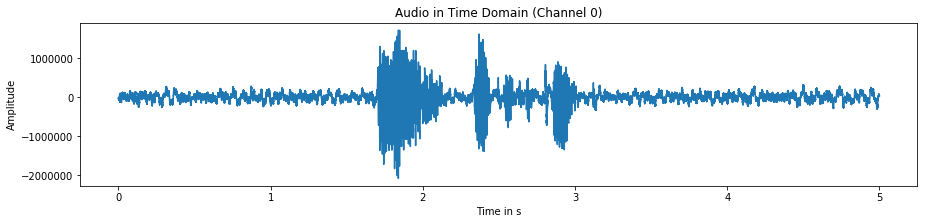

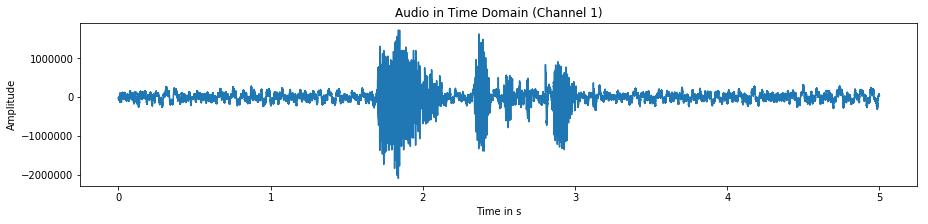

In [12]:
plotAmplitudeOverTime("data/recording_demo.wav")

###  Frequency spectrum

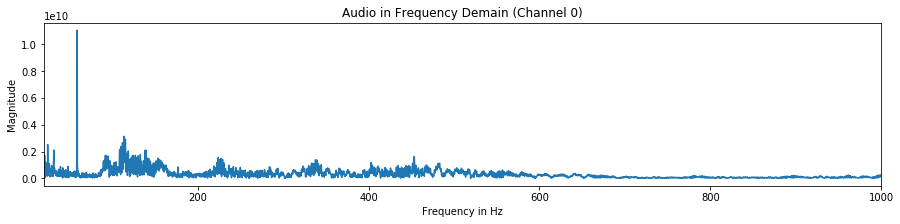

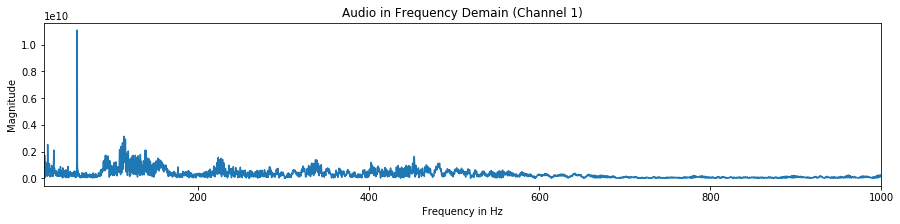

In [78]:
plotFrequencySpectrum("data/recording_demo.wav")

###  Frequency spectrum over time
Use the `classic` plot style for better display.

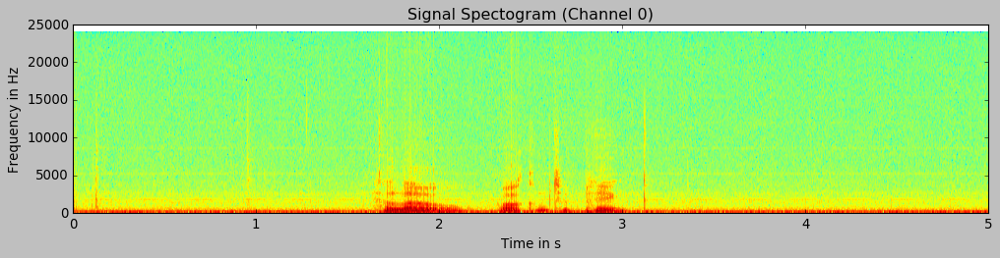

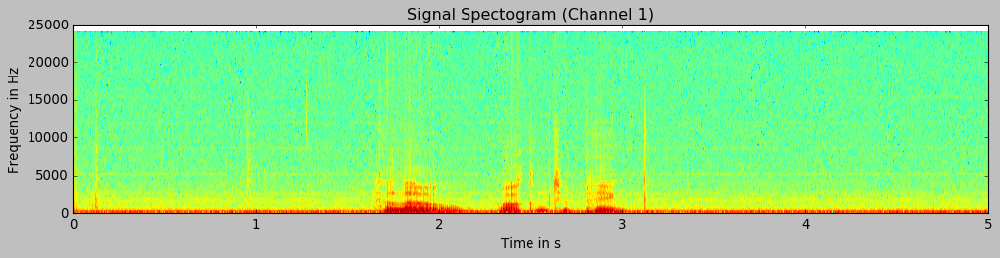

In [15]:
plotFrequencyOverTime("data/recording_demo.wav")

---

## Adding Sound Effect

Create a new file with effects added. [Information for effects can be found here](https://github.com/carlthome/python-audio-effects/blob/master/pysndfx/dsp.py)\


First we import the Audio Effect Chain, and set a audio effect to "fx" object. In here, we use reverb effect.

In [55]:
from pysndfx import AudioEffectsChain

fx = AudioEffectsChain().reverb()

### Play in notebook

Let's play the original sound first.

In [97]:
IPAudio("data/recording_demo.wav")

### Add the effect
Then we apply the audio effect to a wave 

In [72]:
fx("data/recording_demo.wav","data/recording_demoEffect.ogg")

### Play in notebook

Let's play the sound after applying effect.

In [95]:
IPAudio("data/recording_demoEffect.ogg")

There are a lot of different type of audio effect included in the library, you may read the documentation to find out more.

---

## Your Voice

You can then try to load your own recording!
First you can record a sound from the mic then apply a effect to the recording.

In [ ]:
#Write your code here



---

## Adding Sound Effect to a Song

We are going to apply the effect to a guitar track to make it sound like how it was performed by the band.
The track is the first 20s of the song.

https://www.youtube.com/watch?v=Rbm6GXllBiw


In here, we use Chorus effect

In [55]:
from pysndfx import AudioEffectsChain

fx = AudioEffectsChain().chorus(0.7,0.9,[[55,0.4,0.5,5,"t"]])

Then we apply the audio effect to the soundtrack.

In [72]:
fx("data/ParadiseCityOriginal.wav","data/ParadiseCityEffect.ogg")

### Play in notebook

Let play the original Song first.

In [74]:
IPAudio("data/ParadiseCityOriginal.ogg")

### Play in notebook

Then the one after effect is applied.

In [81]:
IPAudio("data/ParadiseCityEffect.ogg")

---

## Digital Filter

Now we will learn and try how a ditigal filter help remove noise or certain frequency in the audio.

### Load and play
Load a sample and play the loaded sample.

In [96]:
IPAudio("data/recording_noisespeech.wav")

### Visualise the noise
We can also visualise the frequency spectrum. Here we set the upper limit of the grpah to 6000Hz.

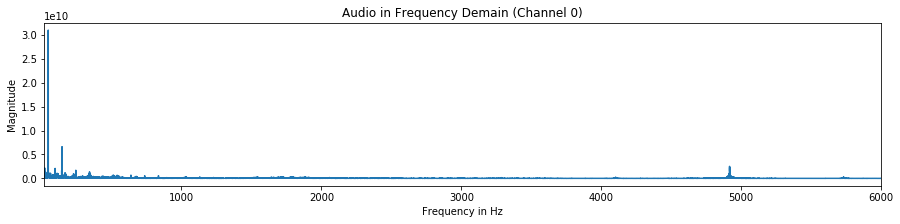

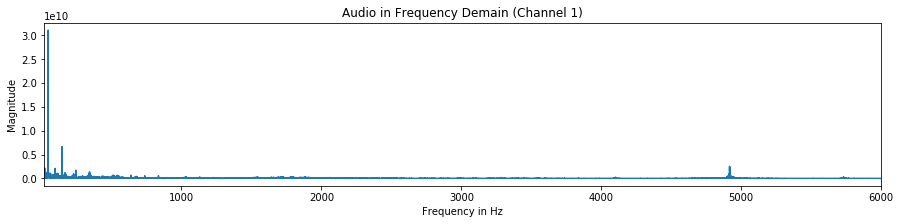

In [82]:
plotFrequencySpectrum("data/recording_noisespeech.wav", 6000)

### Adding a filter
Now we can add a bandreject filter to filter out the noise at around 4900Hz.

In [60]:
from pysndfx import AudioEffectsChain

fx = AudioEffectsChain().bandreject(4900)

Then we apply the audio effect to a wave 

In [ ]:
fx("data/recording_noisespeech.wav","data/recording_noisespeech_filter.ogg")

And play it out.

In [91]:
IPAudio("data/recording_noisespeech_filter.wav")

We can then visualise the frequency spectrum after we format the output audio to wav file

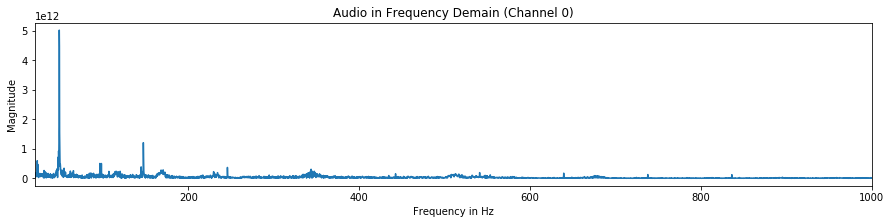

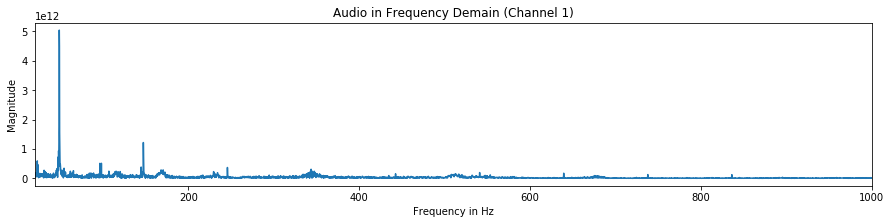

In [84]:
from pydub import AudioSegment

wav = AudioSegment.from_ogg("data/recording_noisespeech_filter.ogg")
wav.export("data/recording_noisespeech_filter.wav", format="wav")

plotFrequencySpectrum("data/recording_noisespeech_filter.wav")

---

## Google's Speech API
### Using Text to Speech
You can use this wrapper for Google's text-to-speech service to produce natural sounding speech.

In [63]:
from gtts import gTTS

words = "This is City University of Hong Kong crossover GEF AIoT Course."

tts = gTTS(words)
tts.save("data/ttsdemo.mp3")

Then we convert the mp3 audio file to wav fromat.

In [64]:
from pydub import AudioSegment

mp3 = AudioSegment.from_mp3("data/ttsdemo.mp3")
mp3.export("data/ttsdemo.wav", format="wav")

<_io.BufferedRandom name='data/ttsdemo.wav'>

Play the audio file in the notebook.

In [49]:
IPAudio("data/ttsdemo.wav")

### Using Speech to Text
You can use this wrapper for Google's speech recognition service to extract words from an audio file.

In [70]:
import speech_recognition as sr
r = sr.Recognizer()

with sr.AudioFile("data/recording_demo.wav") as source:
    audio = r.record(source)

In [71]:
r.recognize_google(audio)

'hello welcome to Pink'

In [65]:
pAudio.select_microphone()
pAudio.record(5)
pAudio.save("data/recording_speech.wav")